In [1]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
from PIL import Image
import numpy as np
import tensorflow as tf
from tensorflow.python.framework.ops import EagerTensor
import pprint

In [2]:
tf.random.set_seed(272)
pp = pprint.PrettyPrinter(indent=4)
img_size = 400
vgg = tf.keras.applications.VGG19(include_top=False,
                                  input_shape=(img_size, img_size, 3),
                                  weights='C:/Users/USER/Documents/python projects/neural style transfer/vgg19_weights_tf_dim_ordering_tf_kernels_notop.h5')
vgg.trainable = False
pp.pprint(vgg)

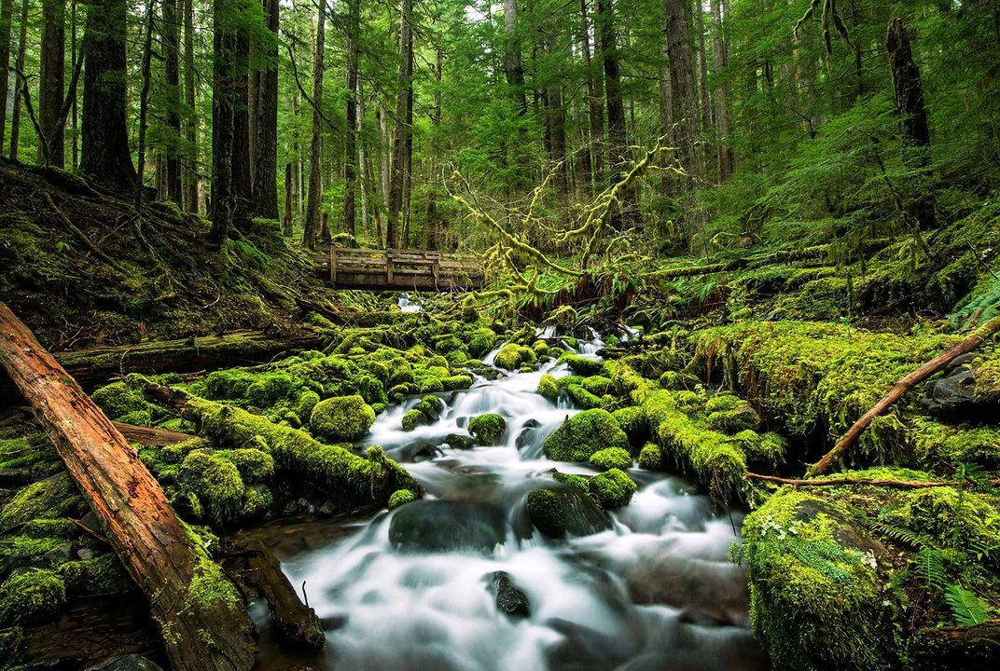

In [3]:
content_image=Image.open('C:/Users/USER/Documents/python projects/neural style transfer/nature.jpg')
content_image

In [4]:
def content_cost_calculate(content_output,generated_output):
    a_C=content_output[-1]
    a_G=content_output[-1]
    _,n_H,n_W,n_C=a_G.get_shape().as_list()
    a_C_unrolled = tf.reshape(a_C,[-1])
    a_G_unrolled = tf.reshape(a_G,[-1])
    J_content=tf.reduce_sum(tf.square(a_C_unrolled-a_G_unrolled))/(4*n_H*n_W*n_C)
    return J_content

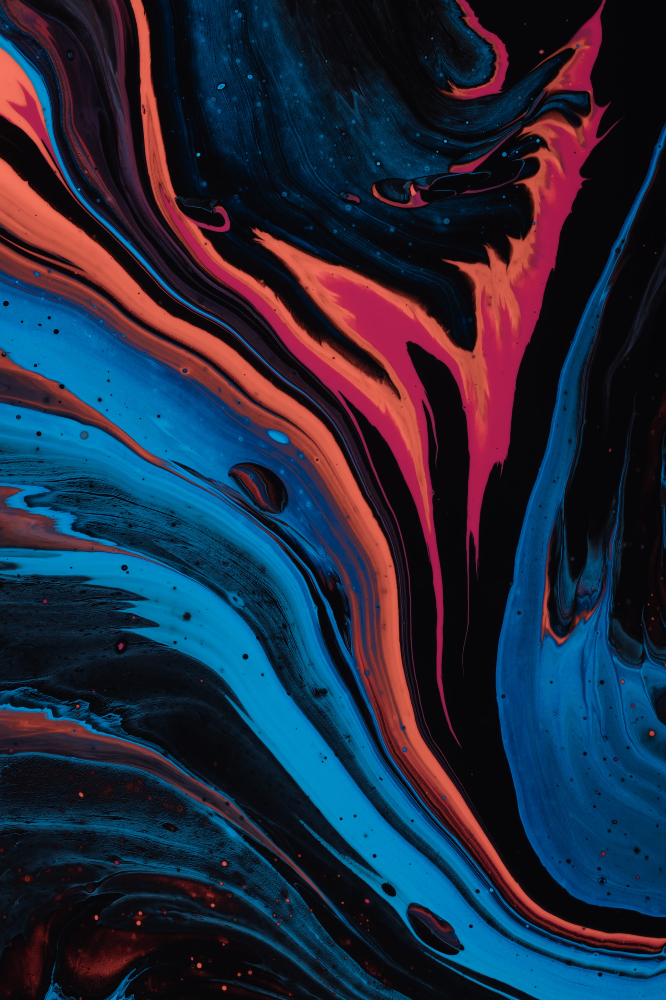

In [5]:
example = Image.open('C:/Users/USER/Documents/python projects/neural style transfer/abstract.jpg')
example

In [6]:
def gram_matrix(A):
    GA=tf.matmul(A,tf.transpose(A))
    return GA

In [7]:
def style_layer_cost_calculate(a_S,a_G):
    _,n_H,n_W,n_C=a_G.get_shape().as_list()
    a_S = tf.reshape(a_S, [n_H*n_W, n_C])
    a_G = tf.reshape(a_G, [n_H*n_W, n_C])
    GS = gram_matrix(tf.transpose(a_S)) 
    GG = gram_matrix(tf.transpose(a_G))
    J_style_layer = tf.reduce_sum(tf.square(GS-GG)) / (4 * n_C**2 * (n_W * n_H)**2)
    return J_style_layer
    

In [8]:
for layer in vgg.layers:
    print(layer.name)

input_1
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


In [9]:
vgg.get_layer('block5_conv2').output

<KerasTensor: shape=(None, 25, 25, 512) dtype=float32 (created by layer 'block5_conv2')>

In [10]:
STYLE_LAYERS = [
    ('block1_conv1', 0.2),
    ('block2_conv1', 0.2),
    ('block3_conv1', 0.2),
    ('block4_conv1', 0.2),
    ('block5_conv1', 0.2)]

In [11]:
def style_cost_calculate(style_image_output, generated_image_output, STYLE_LAYERS=STYLE_LAYERS):
    J_style = 0
    a_S = style_image_output[:-1]
    a_G = generated_image_output[:-1]
    for i, weight in zip(range(len(a_S)), STYLE_LAYERS):
        J_style_layer = style_layer_cost_calculate(a_S[i], a_G[i])
        J_style += weight[1] * J_style_layer
    return J_style
    

In [12]:
@tf.function()
def total_cost(J_content, J_style, alpha = 10, beta = 40):
    J = alpha*J_content + beta*J_style
    return J


loading content image


(1, 400, 400, 3)


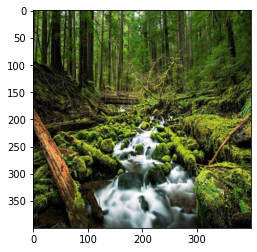

In [21]:
content_image=np.array(Image.open('C:/Users/USER/Documents/python projects/neural style transfer/nature.jpg').resize((img_size, img_size)))
content_image = tf.constant(np.reshape(content_image, ((1,) + content_image.shape)))
print(content_image.shape)
imshow(content_image[0])
plt.show()

loading style image

(1, 400, 400, 3)


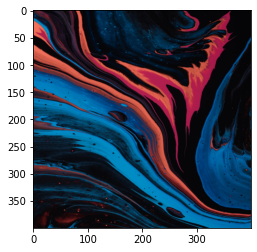

In [23]:
style_image=np.array(Image.open('C:/Users/USER/Documents/python projects/neural style transfer/abstract.jpg').resize((img_size, img_size)))
style_image = tf.constant(np.reshape(style_image, ((1,) +style_image.shape)))
print(style_image.shape)
imshow(style_image[0])
plt.show()

 Randomly Initialize the Image to be Generated

(1, 400, 400, 3)


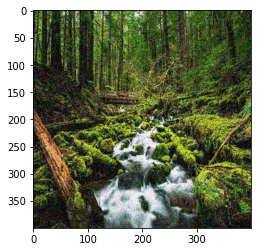

In [24]:
generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
noise = tf.random.uniform(tf.shape(generated_image), -0.25, 0.25)
generated_image = tf.add(generated_image, noise)
generated_image = tf.clip_by_value(generated_image, clip_value_min=0.0, clip_value_max=1.0)

print(generated_image.shape)
imshow(generated_image.numpy()[0])
plt.show()

load vgg19

In [26]:
def get_layer_outputs(vgg, layer_names):
    """ Creates a vgg model that returns a list of intermediate output values."""
    outputs = [vgg.get_layer(layer[0]).output for layer in layer_names]

    model = tf.keras.Model([vgg.input], outputs)
    return model

In [27]:
content_layer = [('block5_conv4', 1)]

vgg_model_outputs = get_layer_outputs(vgg, STYLE_LAYERS + content_layer)

In [28]:
preprocessed_content =  tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
a_C = vgg_model_outputs(preprocessed_content)

In [29]:
preprocessed_style =  tf.Variable(tf.image.convert_image_dtype(style_image, tf.float32))
a_S = vgg_model_outputs(preprocessed_style)

In [30]:
def clip_0_1(image):
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

In [34]:
def tensor_to_image(tensor):
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return Image.fromarray(tensor)

In [42]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)

@tf.function()
def train_step(generated_image):
    with tf.GradientTape() as tape:
        a_G = vgg_model_outputs(generated_image)
        
        # Compute the style cost
        J_style =  style_cost_calculate(a_S,a_G )
        # Compute the content cost
        J_content =content_cost_calculate(a_C, a_G)
        # Compute the total cost
        J = total_cost(J_content, J_style,10,40)
        
    grad = tape.gradient(J, generated_image)

    optimizer.apply_gradients([(grad, generated_image)])
    generated_image.assign(clip_0_1(generated_image))
    return J

Epoch 0 


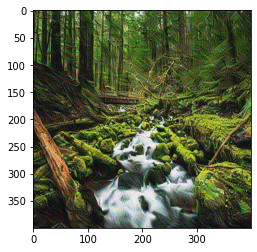

Epoch 250 


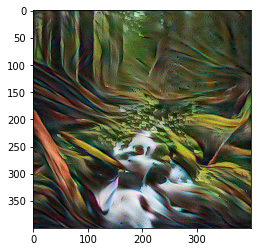

KeyboardInterrupt: 

In [44]:
epochs = 2501
for i in range(epochs):
    train_step(generated_image)
    if i % 250 == 0:
        print(f"Epoch {i} ")
    if i % 250 == 0:
        image = tensor_to_image(generated_image)
        imshow(image)
        
        plt.show() 